# Проект: Рынок заведений общественного питания Москвы

## Описание проекта. Описание данных. Инструкция по выполнению проекта

### Описание проекта

**Заказчиком** являются представители инвестиционного фонда «Shut Up and Take My Money», которые пытаются найти себя в новой области, а именно в сфере общественного питания. 

**Задание** заключается в подготовке исследования рынка общественного питания города Москвы, в поиске интересных особенностей. Выводы и рекомендации исследования должны в будущем помочь в выборе подходящего места, категории заведения и его параметров.


### Описание данных

Файл moscow_places.csv:

- **name** — название заведения;
- **address** — адрес заведения;
- **category** — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- **hours** — информация о днях и часах работы;
- **lat** — широта географической точки, в которой находится заведение;
- **lng** — долгота географической точки, в которой находится заведение;
- **rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- **price** — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- **avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

   «Средний счёт: 1000–1500 ₽»;

   «Цена чашки капучино: 130–220 ₽»;

   «Цена бокала пива: 400–600 ₽».

   и так далее;

- **middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

   Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

   Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

   Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- **middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

   Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

   Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

   Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- **chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);

- **district** — административный район, в котором находится заведение, например Центральный административный округ;
- **seats** — количество посадочных мест.

# Выполнение проекта

## Загрузка файла с данными и изучение информации

Загрузка библиотек:

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
from plotly import graph_objects as go
import plotly.express as px
import numpy as np
import seaborn as sns
from scipy import stats as st
from datetime import datetime, timedelta
import pandas as pd
pd.options.display.float_format = "{:,.2f}".format
import scipy.stats as stats
import datetime as dt
import math as mth
import os
import folium
import re
from folium import Marker, Map
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
from folium import Map, Choropleth
import json

Загрузка файла с помощью библиотеки os:

In [2]:
pth1 = '/datasets/moscow_places.csv'
pth2 = 'moscow_places.csv'

if os.path.exists(pth1):
    df = pd.read_csv(pth1)
elif os.path.exists(pth2):
    df = pd.read_csv(pth2)
else:
    print('Something is wrong')

Просмотр и изучение датасета:

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


**Вывод раздела:** 

Датасет состоит из информации о 8406 заведениях структурированной 14 столбцами:

- **name** - название заведения. Тип данных object
- **category** - категория заведения. Тип данных object
- **address** - адрес заведения. Тип данных object
- **district** - район заведения. Тип данных object
- **hours** - время работы заведения. Тип данных object
- **lat** - широта в географических координатах заведения. Тип данных float 
- **lng** - долгота в географических координатах заведения. Тип данных float 
- **rating** - рейтинг заведения. Тип данных float 
- **price** - категория цен в заведении. Тип данных object
- **avg_bill** - диапазон средней стоимости заказа. Тип данных object
- **middle_avg_bill** - значение средней стоимости заказа. Тип данных float
- **middle_coffee_cup** - средняя стоимость чашки кофе. Тип данных float
- **chain** - отнесение заведения к сетевым. Тип данных integer
- **seats** - количество посадочных мест. Тип данных float




## Предобработка данных

Проверим данные на наличие дубликатов


In [5]:
df.duplicated().sum()

0

Полных дубликатов нет

Проверим лог на наличие пропусков:

In [6]:
display(df.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Есть пропуски в шести столбцах. Их заполнение скорее всего будет трудоемким: добустим столбец 'hours' имеет более 1000 вариантов времени работы заведений общественного питания. Обработка числовых данных, допустим средними, однозначно приведет к искажению агрегированных данных полученных в рамках анализа. 

Создадим столбец street с названиями улиц из столбца с адресом:

In [7]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк', 'мост', 'роща', 'ландшафтный заказник', 'пруды', 'пруд']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat, flags=re.I)

In [8]:
display(df['street'].isna().sum())

135

In [9]:
df1=df[df['street'].isnull()]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
print(df1['address'])

25                                                                                                           Москва, парк Левобережный
60                                                                                           Москва, ландшафтный заказник Лианозовский
64                                                                                         Москва, Лианозовский парк культуры и отдыха
73                                                                                                              Москва, парк Алтуфьево
137                                                                                                       Москва, парк Ангарские пруды
157                                                                                                Москва, Проектируемый проезд № 5265
189                                                                                                       Москва, парк Ангарские Пруды
215                                                    

В результате мы не смогли заполнить "вытащить" все улицы из столбца с адресами. Наличие 135 необработанных строк обусловлено не стандартными исходными данными-адресами в этих строках.

135 строчек - это менее 2% от датасета. Влияние на анализ не должно быть сильным, поэтому оставляем как есть.



Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): логическое значение True — если заведение работает ежедневно и круглосуточно, и False если в противоположном случае:

In [10]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [11]:
display(df['is_24/7'].isna().sum())

536

В новом столбце также имеются пропуски. Но это в связи с тем, что и в исходном они присутствовали в таком же кол-ве.

**Вывод раздела:** 

Дубликаты в датасете отсутствуют. 

Пропуски имеются в шести столбцах в связи с тем, что данные в датасет собирались из разных источних, в т.ч. заполнялись пользователями-клиентами заведений общественного питания. Заполнить пропуски, без потери репрезентативности не представляется возможным

Для последующего анализа были созданы:
- столбец "street" с названиями улиц и столбца с адресом, и 
- столбец "is_24/7" который сообщает о графики работы заведения



## Анализ данных

### Категории заведений

Посмотрим какие категории заведений представленны в данных:

In [12]:
df['category'].nunique()

8

In [13]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Итак, всего восемь категорий и это: кафе, ресторан, кофейня, пиццерия, бар(паб), заведения быстрого питания, булочные и столовые

In [14]:
df_category=df.groupby('category').agg({'category':'count'})
df_category = df_category.rename(columns={'category':'quantity'}).sort_values(by='quantity', axis=0, ascending=False).reset_index()

df_category['share, %']=round(df_category['quantity']/df_category['quantity'].sum()*100, 1)
display(df_category)

,category,quantity,"share, %"
0,кафе,2378,28.30
1,ресторан,2043,24.30
2,кофейня,1413,16.80
3,"бар,паб",765,9.10
4,пиццерия,633,7.50
5,быстрое питание,603,7.20
6,столовая,315,3.70
7,булочная,256,3.00


По кол-ву в ТОПе-3 - кафе (2378 заведений), рестораны - 2043 заведения и кофейни - 1413 заведений. 

In [15]:
fig = px.bar(df_category, x='category', y='quantity', title='Количество заведений по категориям', 
             labels={'quantity':'количество', 'share, %':'доля'}, opacity=0.8, text='share, %', 
             width=800, height=500)
fig.update_traces(textposition='outside')
#fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_xaxes(tickangle=45)
fig.show() 

In [16]:

fig = go.Figure(data=[go.Pie(labels=df_category['category'], values=df_category['quantity'], 
                             title='Количество заведений по категориям', textinfo ="value+percent")])
fig.show()

По тройку лидеров по количеству заведений попали следующие категории:
- кафе, с кол-вом заведений 2378 (28,3%)
- рестораны, 2043 заведения (24,3%)
- кофейни, 1413 заведения (16,8%) 

### Анализ посадочных мест:

Выведен на экран информацию о среднем кол-ве посадочных мест по каждой категории заведений общественного питания:

In [17]:
df_seats=df.pivot_table(index=['category'], values='seats', aggfunc={'median'}).sort_values(by='median', ascending=False)
df_seats

,median
category,
ресторан,86.00
"бар,паб",82.50
кофейня,80.00
столовая,75.50
быстрое питание,65.00
кафе,60.00
пиццерия,55.00
булочная,50.00


Чтобы исключить влияние некорректной информации о кол-ве посадочных мест, предлагаю при анализе данного параметра опираться на показатель медиана.

Визуализация: 

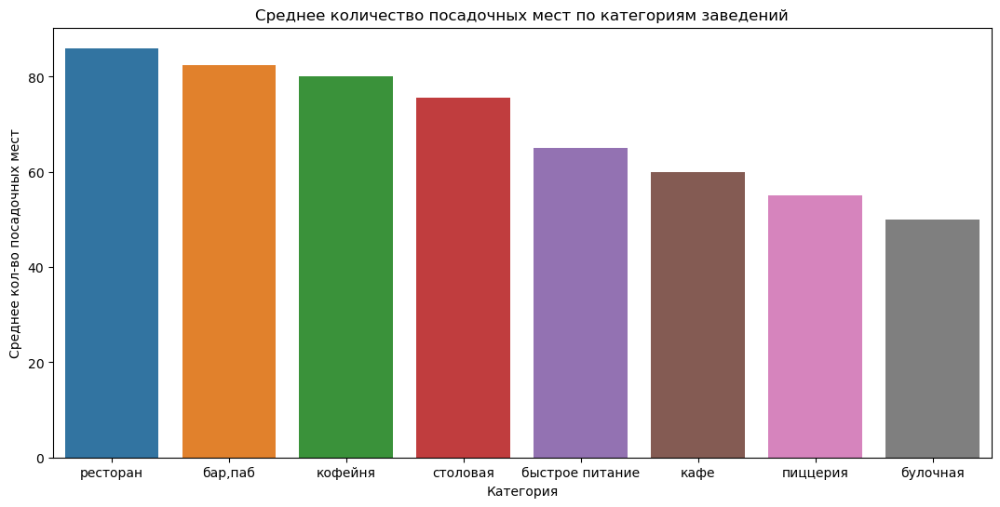

In [18]:
plt.figure(figsize=(13,6))
sns.barplot(x=df_seats.index, y=df_seats['median'])
plt.title("Среднее количество посадочных мест по категориям заведений")
plt.xlabel("Категория")
plt.ylabel("Среднее кол-во посадочных мест");

**Вывод раздела:** 

В ТОП3 по посадочным местам категории заведений: "ресторан" - 86 мест в среднем, "бар,паб" - 82.5 места в среднем и заведения из категории "кофейня" в среднем 80 мест. Заведения категории "кафе" на шестом месте с кол-вом 60 мест

### Исследуем соотношение сетевых и несетевых заведений

Заменим обозначения 0 и 1 на "Не сеть" и "Сеть": 

In [19]:
df.loc[df['chain'] == 0, 'chain'] = 'Не сеть'
df.loc[df['chain'] == 1, 'chain'] = 'Сеть'

In [20]:
print('Сетевые заведения:', df[df['chain']=='Сеть']['chain'].count())
print('Несетевые заведения:', df[df['chain']=='Не сеть']['chain'].count())

Сетевые заведения: 3205
Несетевые заведения: 5201


In [21]:
chains_number=df.pivot_table(columns='chain', values='category', aggfunc='count')

display(chains_number)

chain,Не сеть,Сеть
category,5201,3205


In [22]:

fig = go.Figure(data=[go.Pie(labels=df['chain'].value_counts().index, values=df['chain'].value_counts(), title='Количество заведений по категориям', textinfo ="value+percent")])
fig.show()

Только 3205 заведений относятся к категории сетевых - это 38% от общего кол-ва заведений

### Сетевые заведения по категорям

Посмотрим распределение количества сетевых/несетевых заведений внутри категорий: 

In [23]:
chain = df.groupby(['category', 'chain'])['chain'].count()
chain.name = 'quantity'
chain = chain.reset_index()
chain

,category,chain,quantity
0,"бар,паб",Не сеть,596
1,"бар,паб",Сеть,169
2,булочная,Не сеть,99
3,булочная,Сеть,157
4,быстрое питание,Не сеть,371
5,быстрое питание,Сеть,232
6,кафе,Не сеть,1599
7,кафе,Сеть,779
8,кофейня,Не сеть,693
9,кофейня,Сеть,720


In [24]:
fig = px.bar(chain, x='category', y='quantity', color='chain', title='Объекты общественного питания', \
             labels=dict(quantity="Тип объекта", object_type="Кол-во объектов, шт."))
fig.update_xaxes(tickangle=20)
fig.show()

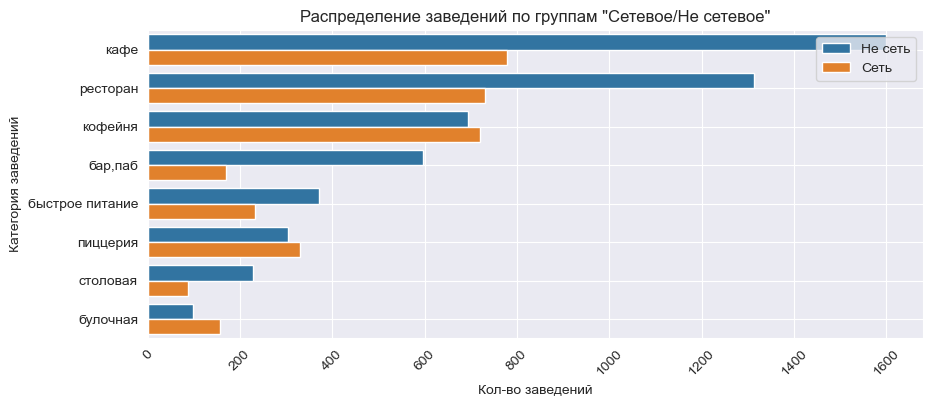

In [25]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='quantity', y='category', data=chain.reset_index().sort_values('quantity', ascending=False), hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений по группам "Сетевое/Не сетевое"')
plt.xlabel('Кол-во заведений')
plt.ylabel('Категория заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Посмотрим как распределяются доли сетевых/несетевых заведений внутри категорий:

In [26]:
chain_joined=pd.merge(chain, df_category, on='category', how='left')
chain_joined=chain_joined.loc[:, 'category': 'quantity_y']
chain_joined['share, %']=round(chain_joined['quantity_x']/chain_joined['quantity_y']*100, 2)
chain_joined

,category,chain,quantity_x,quantity_y,"share, %"
0,"бар,паб",Не сеть,596,765,77.91
1,"бар,паб",Сеть,169,765,22.09
2,булочная,Не сеть,99,256,38.67
3,булочная,Сеть,157,256,61.33
4,быстрое питание,Не сеть,371,603,61.53
5,быстрое питание,Сеть,232,603,38.47
6,кафе,Не сеть,1599,2378,67.24
7,кафе,Сеть,779,2378,32.76
8,кофейня,Не сеть,693,1413,49.04
9,кофейня,Сеть,720,1413,50.96


In [27]:
fig = px.bar(chain_joined, x='category', y='share, %', color='chain', title='Объекты общественного питания', \
             labels=dict(quantity="Тип объекта", object_type="Кол-во объектов, шт."))
fig.update_xaxes(tickangle=20)
fig.show()

В ТОП3 категорий где самое большое количество сетевых заведений входят, в порядке уменьшения, кафе - 779 заведений, рестораны - 730 заведений и кофейни - 720. Самые большие доли сетевых заведений в категории "булочная" - более 61 %. Далее идут пиццерии и кафейни. В них сетвые заведения занимают, соответственно, 52 и 51 %%

### Популярные сетевые заведения

In [28]:
df['name'] = df['name'].replace('Яндекс.Лавка', 'Яндекс Лавка')
# df['street'] = df['street'].replace('улица Миклухо-Маклая', 'МиклухоМаклая')
# df['name'] = df['name'].replace('Домино'с Пицца', 'Домино с Пицца'

Выведем на экран ТОП-15 популярных сетей в Москве. Степень популярности зависит от кол-ва заведений сети:

In [29]:
df_n=df[df['chain'] == 'Сеть'].groupby('name').agg({'name' : 'count', 'category' : pd.Series.mode, 'rating': 'mean'})

df_n.columns = ['quantity','category','avo_rating']

df_n=df_n.sort_values('quantity', ascending = False).reset_index().head(15)
display(df_n)

,name,quantity,category,avo_rating
0,Шоколадница,120,кофейня,4.18
1,Домино'с Пицца,76,пиццерия,4.17
2,Додо Пицца,74,пиццерия,4.29
3,Яндекс Лавка,72,ресторан,3.86
4,One Price Coffee,71,кофейня,4.06
5,Cofix,65,кофейня,4.08
6,Prime,50,ресторан,4.12
7,Хинкальная,44,кафе,4.32
8,КОФЕПОРТ,42,кофейня,4.15
9,Кулинарная лавка братьев Караваевых,39,кафе,4.39


Визуализация:

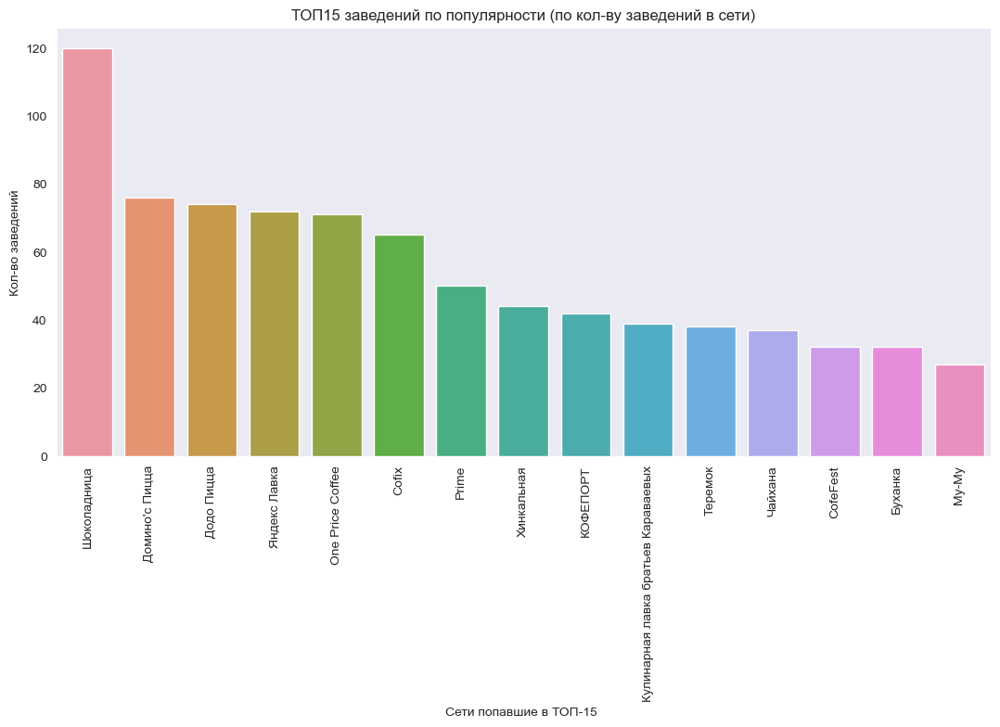

In [30]:
plt.figure(figsize=(13,6))
sns.barplot(x=df_n['name'], y=df_n['quantity'])
plt.title("ТОП15 заведений по популярности (по кол-ву заведений в сети)")
plt.xlabel("Сети попавшие в ТОП-15 ")
plt.ylabel("Кол-во заведений")
plt.xticks(rotation=90);

Мне знакомы 11 сетей из тех что попали в ТОП-15. На первом месте сеть Шоколадница с кол-вом заведений 120. Остальные заведения также на слуху.
Обединяющей особенностью является, то что они являются сетевыми (хотя это очевидно из самого задания).
Очень странно, что Яндекс.Лавка попала в категорию ресторан.

In [31]:
df_n_category=df_n.groupby('category').agg({'category':'count'})
df_n_category.columns=['number']
df_n_category=df_n_category.sort_values('number', ascending=False)
df_n_category

,number
category,
кофейня,5
кафе,4
ресторан,3
пиццерия,2
булочная,1


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'кофейня'),
  Text(1, 0, 'кафе'),
  Text(2, 0, 'ресторан'),
  Text(3, 0, 'пиццерия'),
  Text(4, 0, 'булочная')])

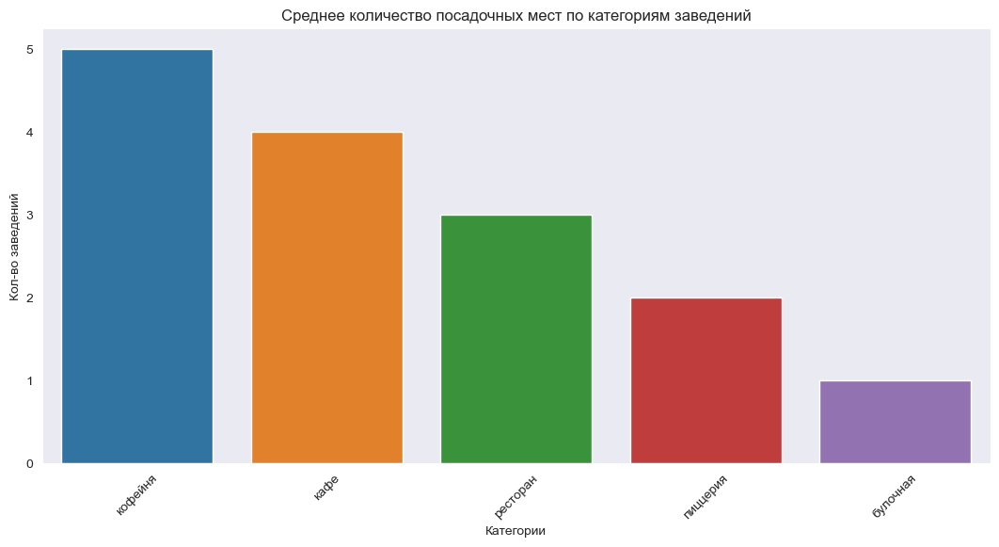

In [32]:
plt.figure(figsize=(13,6))
sns.barplot(x=df_n_category.index, y=df_n_category['number'])
plt.title("Среднее количество посадочных мест по категориям заведений")
plt.xlabel("Категории")
plt.ylabel("Кол-во заведений")
plt.xticks(rotation=45)

5 сетей относятся к категории "кофейня", 4 - "кафе", 3 - "ресторан", 2 - "пиццерия" и 1 - категория "булочная"

In [33]:
df_n=df_n.sort_values('quantity', ascending=False)

Общее кол-во заведений сетей из ТОП-15:

In [34]:
df_new = df[df['name'].isin(df_n['name'].tolist())]
df_new.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.50,4.80,NaN,NaN,NaN,NaN,Сеть,180.00,Базовская улица,False
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.89,37.53,4.70,NaN,NaN,NaN,NaN,Сеть,NaN,Лобненская улица,False
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.52,4.30,NaN,Средний счёт:328 ₽,328.00,NaN,Сеть,46.00,Коровинское шоссе,False
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.52,4.20,NaN,Средний счёт:от 500 ₽,500.00,NaN,Сеть,247.00,Клязьминская улица,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,Сеть,NaN,улица Маршала Федоренко,False


In [35]:
df_pop_new = df_new.groupby('category').agg({'category':'count'})
df_pop_new = df_pop_new.rename(columns={'category':'quantity'}).sort_values(by='quantity', axis=0, ascending=False).reset_index()

df_pop_new['share, %']=round(df_pop_new['quantity']/df_pop_new['quantity'].sum()*100, 1)
df_pop_new


,category,quantity,"share, %"
0,кофейня,336,41.00
1,ресторан,189,23.10
2,пиццерия,151,18.40
3,кафе,100,12.20
4,булочная,25,3.10
5,быстрое питание,12,1.50
6,"бар,паб",4,0.50
7,столовая,2,0.20


In [36]:
display(df_pop_new['quantity'].sum())

819

**Кол-во популярных заведений общественного питания по категориям.**
В ТОП-3 попали кофейни - 336 точек, рестораны - 189 заведений и пиццерия - 151 заведение. Категория кафе занимает 4 место с кол-вом заведений 100 

In [37]:
category_district=df_new.groupby('district').agg({'district':'count'})
category_district=category_district.rename(columns={'district':'quantity'}).sort_values(by='quantity', axis=0, ascending=False).reset_index()

category_district['share, %']=round(category_district['quantity']/category_district['quantity'].sum()*100, 1)
category_district

,district,quantity,"share, %"
0,Центральный административный округ,215,26.30
1,Западный административный округ,89,10.90
2,Южный административный округ,89,10.90
3,Северный административный округ,88,10.70
4,Северо-Восточный административный округ,85,10.40
5,Восточный административный округ,80,9.80
6,Юго-Западный административный округ,70,8.50
7,Юго-Восточный административный округ,56,6.80
8,Северо-Западный административный округ,47,5.70


Самое большое кол-во популярных заведений общественного питания в Центральном административном округе, и это понятно: этот район является историческим, деловым и административным центром города

In [38]:
category_district = df_new.groupby(['district', 'category'])['category'].count()
category_district.name='quantity'
category_district=category_district.reset_index()
category_district.head()



,district,category,quantity
0,Восточный административный округ,"бар,паб",2
1,Восточный административный округ,булочная,1
2,Восточный административный округ,быстрое питание,2
3,Восточный административный округ,кафе,6
4,Восточный административный округ,кофейня,30


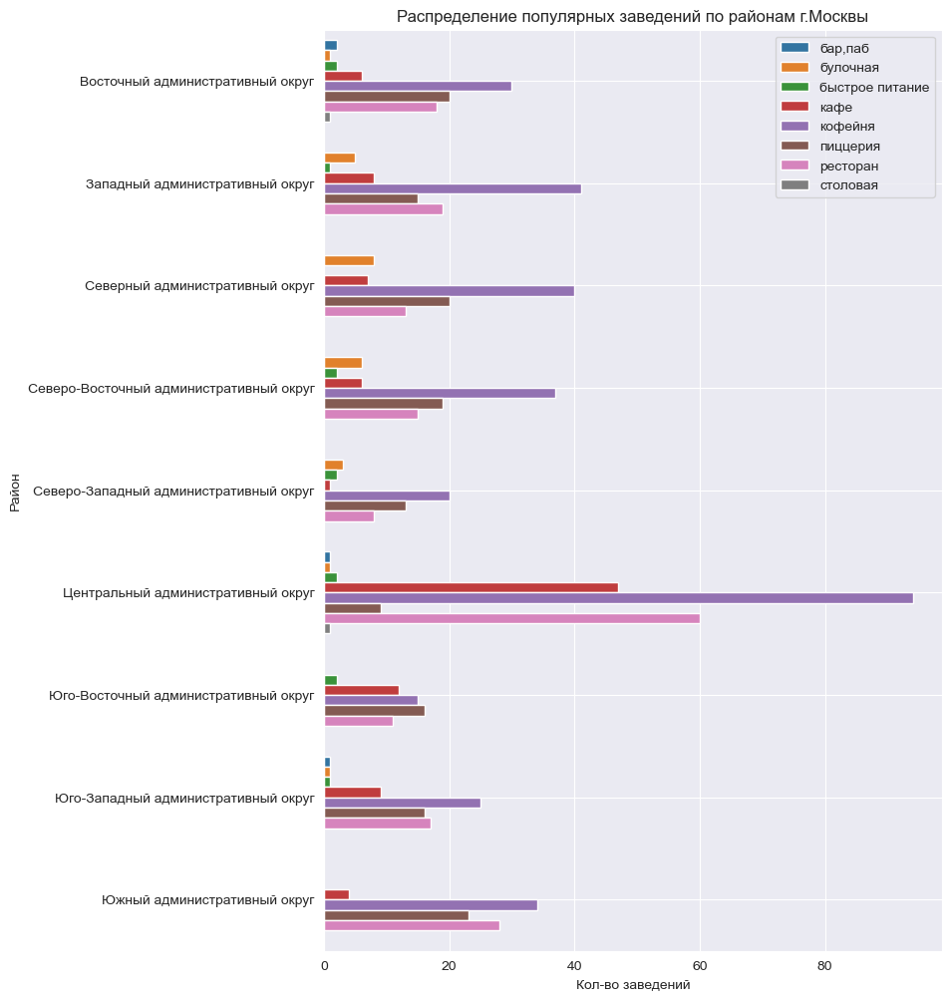

In [39]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(8, 12))
# строим столбчатый график средствами seaborn
sns.barplot(x='quantity', y='district', data=category_district, hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение популярных заведений по районам г.Москвы')
plt.xlabel('Кол-во заведений')
plt.ylabel('Район')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=0)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [40]:
category_district_=df_new.pivot_table(index=['district', 'category'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
category_district_.columns=['district', 'category', 'quantity']
category_district_

,district,category,quantity
0,Центральный административный округ,кофейня,94
1,Центральный административный округ,ресторан,60
2,Центральный административный округ,кафе,47
3,Западный административный округ,кофейня,41
4,Северный административный округ,кофейня,40
5,Северо-Восточный административный округ,кофейня,37
6,Южный административный округ,кофейня,34
7,Восточный административный округ,кофейня,30
8,Южный административный округ,ресторан,28
9,Юго-Западный административный округ,кофейня,25


In [41]:
fig = px.bar(category_district_, x='district', y='quantity', color='category')
fig.update_layout(title="Количество заведений по административным районам",
                  xaxis_title="Округ",
                  yaxis_title="Количество заведений")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

График показывает, что самое большое кол-во популярных заведений сконцентрировано в ЦАО и здесь больше всего кафеен, кафе и ресторанов

### Административные районы в датасете:

In [42]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [43]:
df['district'].nunique()

9

В датасете присутствуют 9 районов. Это: 'Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ', 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ'

In [44]:
df_district=df.groupby('district').agg({'district':'count'})
df_district=df_district.rename(columns={'district':'quantity'}).sort_values(by='quantity', axis=0, ascending=False).reset_index()

df_district['share, %']=round(df_district['quantity']/df_district['quantity'].sum()*100, 1)
df_district




,district,quantity,"share, %"
0,Центральный административный округ,2242,26.70
1,Северный административный округ,900,10.70
2,Южный административный округ,892,10.60
3,Северо-Восточный административный округ,891,10.60
4,Западный административный округ,851,10.10
5,Восточный административный округ,798,9.50
6,Юго-Восточный административный округ,714,8.50
7,Юго-Западный административный округ,709,8.40
8,Северо-Западный административный округ,409,4.90


In [45]:
fig = px.bar(df_district, x='district', y='quantity', title='Количество заведений по районам', 
             labels={'district':'Район','quantity':'количество'}, opacity=0.8, text='quantity',  width=1000, height=800)
fig.update_traces(textposition='outside')
#fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_xaxes(tickangle=45)
fig.show() 

In [46]:
district_category = df.groupby(['district', 'category'])['category'].count()
district_category.name = 'quantity'
district_category = district_category.reset_index()
district_category

,district,category,quantity
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
5,Восточный административный округ,пиццерия,72
6,Восточный административный округ,ресторан,160
7,Восточный административный округ,столовая,40
8,Западный административный округ,"бар,паб",50
9,Западный административный округ,булочная,37


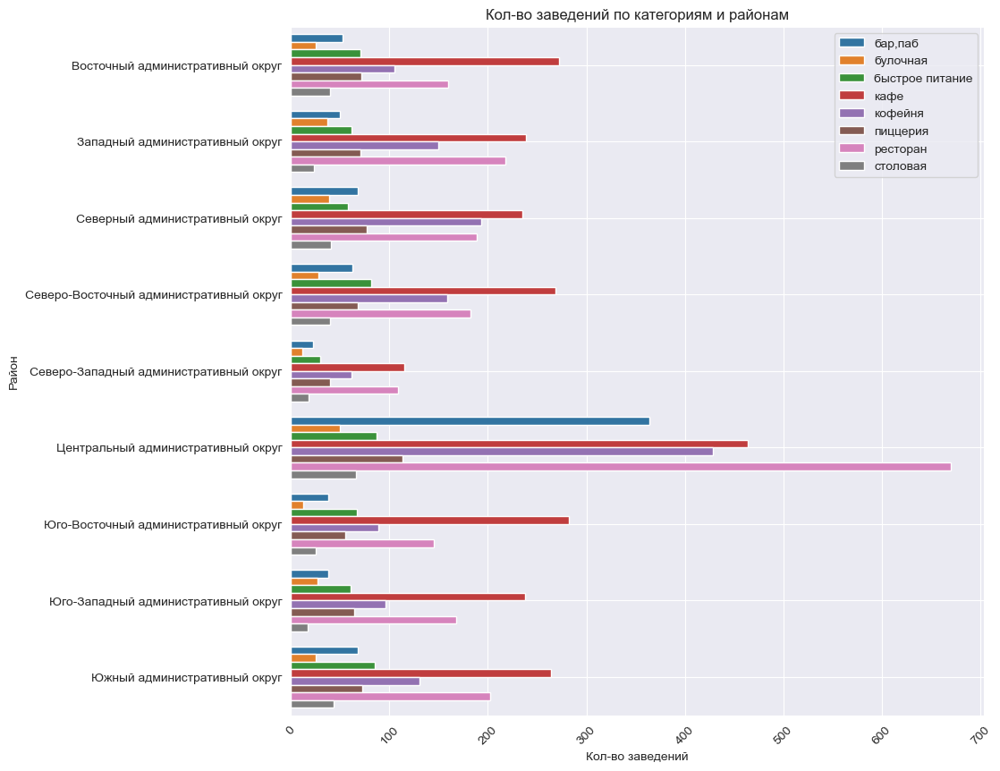

In [47]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='quantity', y='district', data=district_category, hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Кол-во заведений по категориям и районам')
plt.xlabel('Кол-во заведений')
plt.ylabel('Район')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [48]:
district_category=df.pivot_table(index=['district', 'category'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
district_category.columns=['district', 'category', 'quantity']
district_category

,district,category,quantity
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
5,Восточный административный округ,кафе,272
6,Северо-Восточный административный округ,кафе,269
7,Южный административный округ,кафе,264
8,Западный административный округ,кафе,239
9,Юго-Западный административный округ,кафе,238


In [49]:
fig = px.bar(district_category, x='district', y='quantity', color='category')
fig.update_layout(title="Кол-во заведений по категориям и районам",
                  xaxis_title="Округ",
                  yaxis_title="Количество заведений")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Самое большое кол-во заведний общественного питания в ЦАО 2242 заведений (26,7%), на втором месте Северный административный округ	900 заведений (10,7%), третье место делят Южный и Северо-Восточный административные округа	892-891 заведения (10,6%).
В разрезе категорий заведений ЦАО также заметно лидирует.

### Средний рейтинг по категориям

In [50]:
category_rating = df.groupby('category', as_index=False)['rating'].agg('mean').sort_values('rating', ascending=False)
category_rating['rating'] = round(category_rating['rating'], 2)
category_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [51]:
fig = px.bar(category_rating, x='category', y='rating', title='Средний рейтинг заведения по категориям', 
             labels={'category':'Категория','rating':'Средний рейтинг заведения'}, opacity=0.8, text='rating',  width=800, height=500)
fig.update_traces(textposition='outside')
#fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_xaxes(tickangle=45)
fig.update_yaxes(range=(4, 4.5))
fig.show() 

Средний рейтинг категорий заведний колеблется от 4.05 до 4.39 - отклонение на мой взгляд не значительное. В тройку лидеров по рейтингу попали категории "бар,паб" - это лидер с оценкой 4.39, категория "пиццерия" - рейтинг 4.3 и "ресторан" с рейтингом 4.29. У "кафейни" средний рейтинг 4.28 - 4е место, а категории "кафе" занимает предпоследнее место с рейтингом 4.12

### Средний рейтинг заведений по районам. Хороплет

In [52]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values('rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Средний рейтинг по районам колеблется от 4.10 до 4.38. На первом месте Центральный административный округ с рейтнгом 4.38, далее идет Северный административный округ - 4.24 и на третьем месте - Северо-Западный административный округ с рейтингом 4.21

Хороплет

In [53]:
# /datasets/

In [54]:

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [55]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [56]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### ТОП-15 улиц по количеству заведений.

In [57]:
top15_street = df.groupby('street')['category'].count()
top15_street.name = 'quantity'
top15_street = top15_street.reset_index()
top15_street = top15_street.sort_values('quantity', ascending=False).head(15)
top15_street

,street,quantity
1036,проспект Мира,184
758,Профсоюзная улица,122
1033,проспект Вернадского,108
514,Ленинский проспект,107
512,Ленинградский проспект,95
365,Дмитровское шоссе,88
446,Каширское шоссе,77
295,Варшавское шоссе,75
513,Ленинградское шоссе,69
536,МКАД,65


In [58]:
fig = px.bar(top15_street, x='street', y='quantity', title='ТОП-15 улиц по кол-ву заведений', 
             labels={'street':'Категория','quantity':'количество'}, opacity=0.8, text='quantity',  width=800, height=600)
fig.update_traces(textposition='outside')
#fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_xaxes(tickangle=45)
fig.show() 

In [59]:
top15_street['street'].unique()

array(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского',
       'Ленинский проспект', 'Ленинградский проспект',
       'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе',
       'Ленинградское шоссе', 'МКАД', 'Люблинская улица',
       'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая',
       'Пятницкая улица'], dtype=object)

In [60]:
df_top15_street = df[df['street'].isin(top15_street['street'].tolist())]
df_top15_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,Не сеть,79.00,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.90,37.52,4.30,средние,Средний счёт:330 ₽,330.00,NaN,Не сеть,NaN,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.88,37.45,4.40,средние,Средний счёт:350–500 ₽,425.00,NaN,Не сеть,96.00,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00–22:00",55.88,37.54,4.50,средние,Средний счёт:300–1500 ₽,900.00,NaN,Не сеть,NaN,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.89,37.50,3.80,средние,Средний счёт:400–600 ₽,500.00,NaN,Не сеть,NaN,МКАД,False


In [61]:
df_top15_street = df_top15_street.groupby(['street', 'category'])['category'].count()
df_top15_street.name = 'quantity'
df_top15_street = df_top15_street.reset_index()
df_top15_street

,street,category,quantity
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,17
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
5,Варшавское шоссе,ресторан,20
6,Варшавское шоссе,столовая,7
7,Дмитровское шоссе,"бар,паб",6
8,Дмитровское шоссе,булочная,2
9,Дмитровское шоссе,быстрое питание,10


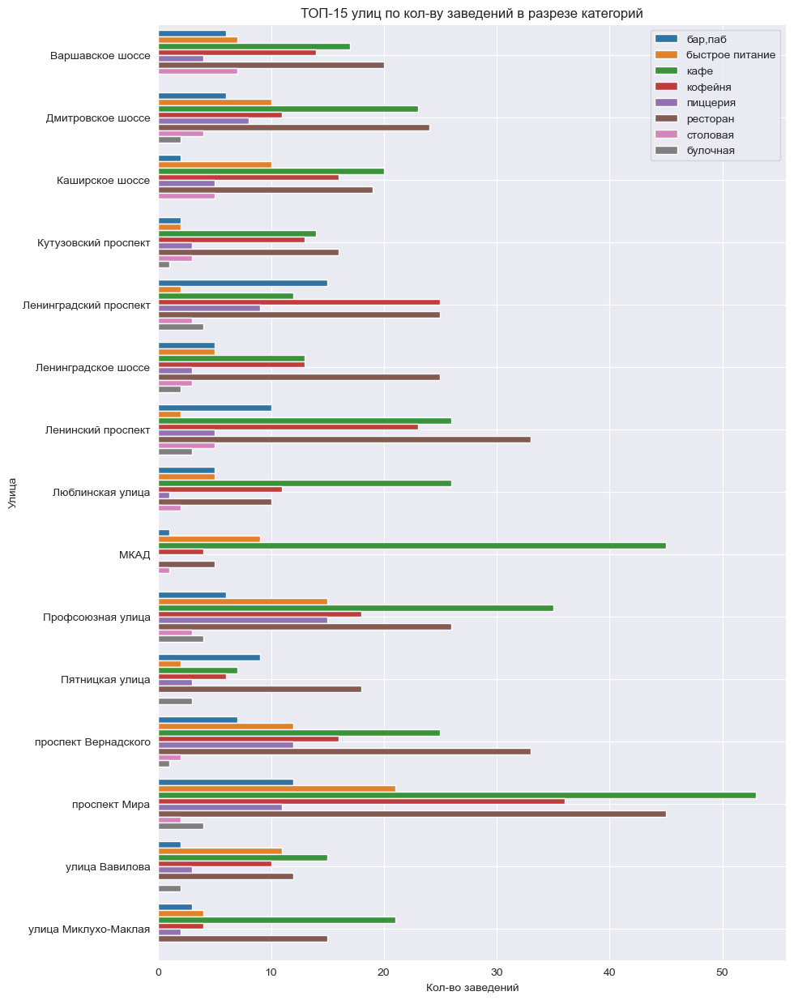

In [62]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 15))
# строим столбчатый график средствами seaborn
sns.barplot(x='quantity', y='street', data=df_top15_street, hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('ТОП-15 улиц по кол-ву заведений в разрезе категорий')
plt.xlabel('Кол-во заведений')
plt.ylabel('Улица')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=0)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [63]:
test32=df.query("street == ['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица', 'Алтуфьевское шоссе']")
test32=test32.pivot_table(index=['street', 'category'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
test32

,street,category,name
0,проспект Мира,кафе,53
1,проспект Мира,ресторан,45
2,проспект Мира,кофейня,36
3,Профсоюзная улица,кафе,35
4,проспект Вернадского,ресторан,33
5,Ленинский проспект,ресторан,33
6,Ленинский проспект,кафе,26
7,Профсоюзная улица,ресторан,26
8,Люблинская улица,кафе,26
9,Ленинградское шоссе,ресторан,25


In [64]:
fig = px.bar(df_top15_street, x='street', y='quantity', color='category')
fig.update_layout(title='Анализ топ 15 улиц по кол-ву заведений',
                  xaxis_title="Наименование улицы",
                  yaxis_title="Категория заведения")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

В топ-3 по количеству заведений попали следующие улицы: 
- в значительном отрыве пр-т Мира -	184 заведения, если сравнивать с тройкой лидеров здесь больше всего заведений в категориях кафе, рестораны, кафейни и быстрое питание
- Профсоюзная ул. - 122 заведения 
- пр-т Вернадского -	108 заведений

Есть некая оссобенность - МКАД (как улица) по количеству кафе на втором месте. Это можно объяснить тем, что данный район с самым высоким траспортным трафиком и соответственно с высоким кол-вом клиентов желающих "взбодриться и подкрепиться"



### Улицы с одним объектом

In [65]:
one_street=df.groupby('street').agg({'street':'count'})
one_street=one_street.rename(columns={'street':'quantity'}).sort_values(by='quantity', axis=0, ascending=True).reset_index()
one_street=one_street[one_street['quantity']==1]
one_street

,street,quantity
0,1-й Автозаводский проезд,1
1,Новомосковская улица,1
2,Новопоселковая улица,1
3,Новороссийская улица,1
4,Новосущёвская улица,1
5,Новощукинская улица,1
6,Новоясеневский тупик,1
7,Одинцовская улица,1
8,Октябрьский переулок,1
9,Ордынский тупик,1


В датасете 425 улиц с одним объектом.

Дополним таблицу данными из общего дата сета:

In [66]:
one_street_adj=pd.merge(one_street, df, on=['street'], how='left')
one_street_adj.head()


,street,quantity,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.70,37.66,4.20,средние,Средний счёт:190–350 ₽,270.00,NaN,Сеть,20.00,True
1,Новомосковская улица,1,Аквафортуна,"бар,паб","Москва, Новомосковская улица, 24",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.82,37.62,4.40,NaN,NaN,NaN,NaN,Не сеть,48.00,True
2,Новопоселковая улица,1,Чай хана халал,кафе,"Москва, Новопоселковая улица, 6, стр. 40",Северо-Западный административный округ,NaN,55.84,37.44,3.60,NaN,NaN,NaN,NaN,Не сеть,NaN,NaN
3,Новороссийская улица,1,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.68,37.76,4.30,NaN,NaN,NaN,NaN,Сеть,40.00,False
4,Новосущёвская улица,1,Ганга,столовая,"Москва, Новосущёвская улица, 26А",Северо-Восточный административный округ,"пн-пт 09:00–18:00; сб,вс 12:00–21:00",55.79,37.60,4.40,NaN,NaN,NaN,NaN,Не сеть,75.00,False


Отобразим данные заведения на карте:

In [67]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
one_street_adj.apply(create_clusters, axis=1)

# выводим карту
m

Т.е. судя по карте такие заведение представлены везде по Москве

Распределение по районам

In [68]:
one_street_district=one_street_adj.groupby('district').agg({'district':'count'})
one_street_district=one_street_district.rename(columns={'district':'quantity'}).sort_values(by='quantity', axis=0, ascending=False).reset_index()
one_street_district['share, %']=round(one_street_district['quantity']/one_street_district['quantity'].sum()*100, 1)
one_street_district

,district,quantity,"share, %"
0,Центральный административный округ,136,32.00
1,Восточный административный округ,52,12.20
2,Северо-Восточный административный округ,49,11.50
3,Северный административный округ,46,10.80
4,Западный административный округ,37,8.70
5,Юго-Восточный административный округ,36,8.50
6,Южный административный округ,36,8.50
7,Северо-Западный административный округ,18,4.20
8,Юго-Западный административный округ,15,3.50


Самое большое кол-во заведений из категории "улица с одним заведением" в ЦАО

In [69]:
one_street_district=pd.merge(one_street_district, df_district, on='district', how='left')
one_street_district

,district,quantity_x,"share, %_x",quantity_y,"share, %_y"
0,Центральный административный округ,136,32.00,2242,26.70
1,Восточный административный округ,52,12.20,798,9.50
2,Северо-Восточный административный округ,49,11.50,891,10.60
3,Северный административный округ,46,10.80,900,10.70
4,Западный административный округ,37,8.70,851,10.10
5,Юго-Восточный административный округ,36,8.50,714,8.50
6,Южный административный округ,36,8.50,892,10.60
7,Северо-Западный административный округ,18,4.20,409,4.90
8,Юго-Западный административный округ,15,3.50,709,8.40


В ЦАО и заведений больше и число улиц с одним заведением в этом округе также больше в сравнении с другими районами. Далее вниз структура меняется.

In [70]:
one_street_category=one_street_adj.groupby('category').agg({'category':'count'})
one_street_category=one_street_category.rename(columns={'category':'quantity'}).sort_values(by='quantity', axis=0, ascending=False).reset_index()
one_street_category['share, %']=round(one_street_category['quantity']/one_street_category['quantity'].sum()*100, 1)
one_street_category

,category,quantity,"share, %"
0,кафе,142,33.40
1,ресторан,90,21.20
2,кофейня,74,17.40
3,"бар,паб",40,9.40
4,столовая,36,8.50
5,быстрое питание,20,4.70
6,пиццерия,14,3.30
7,булочная,9,2.10


В тройку лидеров категории "улица с одним заведением" попали кафе, рестораны и кофейни

**Кол-во "сетевых" и "несетевых" заведений:**

In [71]:
one_street_chain=one_street_adj.pivot_table(columns='chain', values='category', aggfunc='count')

display(one_street_chain)

chain,Не сеть,Сеть
category,309,116


**Среднее кол-во посадочных мест:**

In [72]:
one_street_seats = round(one_street_adj['seats'].mean(),0)
one_street_seats

59.0

Выведем на экран **средний чек по категориям заведений**:

In [73]:
one_street_avobill = one_street_adj.pivot_table(index=['category'], values='middle_avg_bill', aggfunc={'max', 'min','mean'}).sort_values(by='mean', ascending=False)

one_street_avobill

,max,mean,min
category,,,
ресторан,"7,000.00","1,689.29",175.00
"бар,паб","4,500.00","1,400.00",350.00
пиццерия,"1,500.00",785.50,255.00
быстрое питание,"2,750.00",758.33,200.00
кафе,"2,000.00",651.49,67.00
кофейня,"1,450.00",581.67,175.00
столовая,400.00,282.50,200.00


Всего в категорию "улицы с одним заведением" попало 425 улиц. 

Такие улицы присутствуют во всех округах Москвы: самое большое количество в ЦАО - 136 заведений. 

Из 425 улица 116 относятся к категории сетевые.

Среднее кол-во плсадочных мест у таких заведений равно 59.

Средний чек у первой тройки категорий заведений общественного питания: "ресторан" 1689 руб, "паб,бар" - 1400 руб, и "пиццерия" - 785 руб.

Первая тройка таких заведений по кол-ву представлена категорией "кафе" -	142 заведения, "ресторан"	- 90 заведений и "кофейня"	- 74 заведения

### Медиана среднего чека по районам

In [74]:
median_bill_df=df.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').sort_values('middle_avg_bill', ascending=False).reset_index()
median_bill_df['middle_avg_bill']=round(median_bill_df['middle_avg_bill'], 2)
median_bill_df

,district,middle_avg_bill
0,Западный административный округ,"1,000.00"
1,Центральный административный округ,"1,000.00"
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [75]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый "дорогой" чек в Западном и Центральном административных округах (здесь чек 1000.00 руб.). на второмм месте Северо-Западный административный округ	с чеком 700.00руб. и третье место занимает Северный административный округ с чеком	650.00 руб.

### Общие выводы



- В датасете всего восемь категорий и это кафе, ресторан, кофейня, пиццерия, бар(паб), заведения быстрого питания, булочные и столовые. По кол-ву в ТОПе-3 - кафе (2378 заведений, 28,3%), рестораны - 2043 заведения (24,3%) и кофейни - 1413 заведений (16,8%). 
- Показатель среднее кол-во посадочных мест колеблется от 50 до 86 в зависимости от категории заведения. В ТОП3 по посадочным местам категории заведений: "ресторан" - 86 мест в среднем, "бар,паб" - 82.5 места в среднем и заведения из категории "кофейня" в среднем 80 мест. Заведения категории "кафе" на шестом месте с кол-вом 60 мест
- Из 8406 заведений представленных в датасете сетевыми являются 3205 объект (38.1%). В тройку "сетевых" заведений попали кафе - 779 заведений, рестораны - 730 заведений, кафейни - 720 заведений
- Самые большие доли сетевых заведений в категории "булочная" - более 61 %. Далее идут пиццерии и кафейни. В них сетвые заведения занимают, соответственно, 52 и 51 %%
- Кол-во заведений в ТОП-15 самых популярных сетей колеблется от 27 до 120 (всего 819 заведений). Самым популярным является сеть кафеен Шоколадница - 120 заведений. 5 популярных сетей работают в категории "кофейня", 4 в категории "кафе", 3 - "ресторан", 2 - "пиццерия", и одна сеть в категории "булочные". По кол-ву заведений в ТОП-3 попали кофейни - 336 точек, рестораны - 189 заведений и пиццерия - 151 заведение. Категория кафе занимает 4 место с кол-вом заведений 100 
- Самое большое кол-во популярных заведений общественного питания в Центральном административном округе, и это понятно: этот район является историческим, деловым и административным центром города
- В датасете присутствуют 9 округами. Самое большое кол-во заведний общественного питания в ЦАО 2242 заведений (26,7%), на втором месте Северный административный округ 900 заведений (10,7%), третье место делят Южный и Северо-Восточный административные округа 892-891 заведения (10,6%). В разрезе категорий заведений ЦАО также заметно лидирует
- Средний рейтинг категорий заведний колеблется от 4.05 до 4.39 - отклонение на мой взгляд не значительное. В тройку лидеров по рейтингу попали категории "бар,паб" - это лидер с оценкой 4.39, категория "пиццерия" - рейтинг 4.3 и "ресторан" с рейтингом 4.29. У "кафейни" средний рейтинг 4.28 - 4е место, а категории "кафе" занимает предпоследнее место с рейтингом 4.12
- В топ-3 по количеству заведений попали следующие улицы: пр-т Мира -	184 заведения (если сравнивать с тройкой лидеров здесь больше всего заведений в категориях кафе, рестораны, кафейни и быстрое питание), Профсоюзная ул. - 122 заведения и пр-т Вернадского - 108 заведений.
- В датасете 425 улиц на которых расположено одно заведение общественного питания. Из них 116 сетевые и самое большое кол-во таких улиц расположено в ЦАО 
- Самый "дорогой" медианный чек в Западном и Центральном административных округах (здесь чек 1000.00 руб.). на второмм месте Северо-Западный административный округ	с чеком 700.00руб. и третье место занимает Северный административный округ с чеком	650.00 руб.



## Детализируем исследование: открытие кофейни

**Задача**

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

### Сколько всего кофеен. Кол-во по районам. Оссобенности расположения

In [76]:
coffee_count=df[df['category'] == 'кофейня']['category'].count()
print('Кол-во кофеен в Москве:', coffee_count)

Кол-во кофеен в Москве: 1413


In [77]:
coffee_district=df[df['category'] == 'кофейня'].groupby('district').agg({'district':['count']})
coffee_district.columns=['quantity']
coffee_district=coffee_district.sort_values(by='quantity', ascending=False)
coffee_district=coffee_district.reset_index()
display(coffee_district)
print(coffee_district['quantity'].sum())

,district,quantity
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


1413


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Центральный административный округ'),
  Text(1, 0, 'Северный административный округ'),
  Text(2, 0, 'Северо-Восточный административный округ'),
  Text(3, 0, 'Западный административный округ'),
  Text(4, 0, 'Южный административный округ'),
  Text(5, 0, 'Восточный административный округ'),
  Text(6, 0, 'Юго-Западный административный округ'),
  Text(7, 0, 'Юго-Восточный административный округ'),
  Text(8, 0, 'Северо-Западный административный округ')])

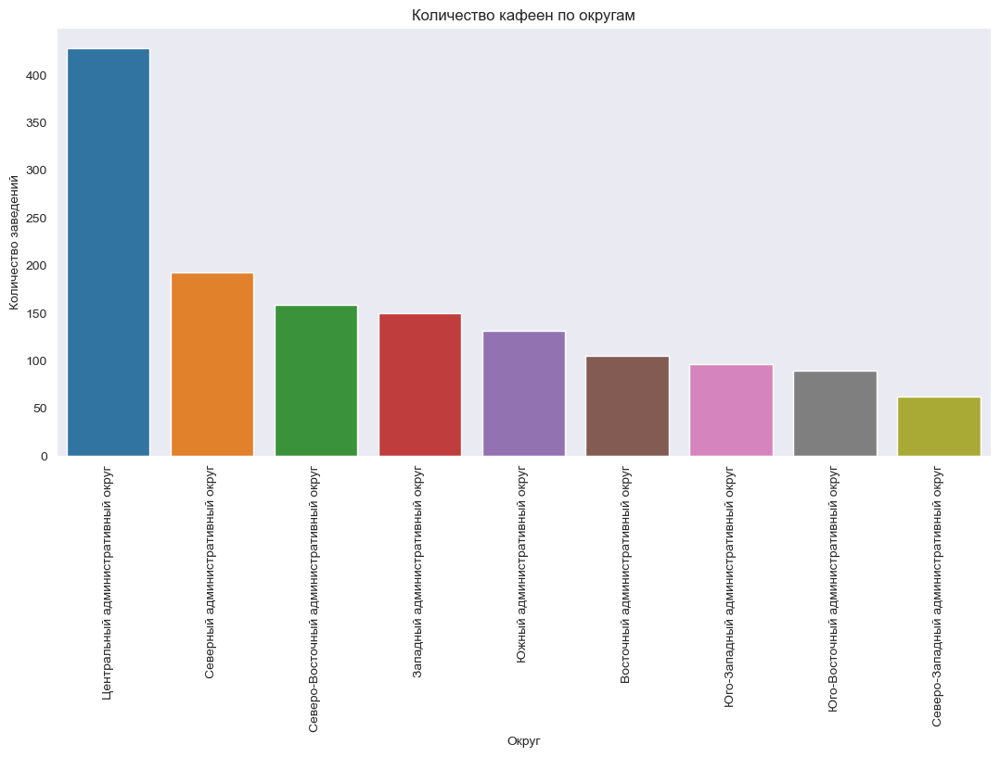

In [78]:
plt.figure(figsize=(13,6))
sns.barplot(x=coffee_district['district'], y=coffee_district['quantity'])
plt.title("Количество кафеен по округам")
plt.xlabel("Округ")
plt.ylabel("Количество заведений")
plt.xticks(rotation=90)

Всего на текущий момент категория "кофейни" представлена 1413 заведениями. Подавляющее кол-во этих заведений расположено в Центральном (428 заведений), Северном (193) и Северо-Восточном (159) административных округах

### Наличие круглосуточных кофеен

Посчитаем кол-во круглосуточных кофеен:

In [79]:
сoffee=df.query('category == "кофейня"')
сoffee.pivot_table(index=['hours'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index().head(15)

,hours,name
0,"ежедневно, 10:00–22:00",140
1,"ежедневно, 08:00–22:00",60
2,"ежедневно, круглосуточно",59
3,"ежедневно, 09:00–22:00",57
4,пн-пт 08:00–19:00,46
5,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",46
6,"ежедневно, 09:00–21:00",43
7,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",42
8,"ежедневно, 08:00–21:00",36
9,пн-пт 08:00–18:30,34


In [80]:
round_clck = df[df['category'] == 'кофейня'].query('hours == "ежедневно, круглосуточно"')
round_clck = round_clck['hours'].count()
print('Кол-во круглосуточных кафеен:', round_clck)

Кол-во круглосуточных кафеен: 59


Малое количество обусловлено, на мой взгляд, малым количеством потенциальных клиентов таких заведений (ночные тусовщики, которым "ночью некуда деться и жеающих снять эмоциональное возбуждение чашечкой кофе или даже ранним — в четыре-пять утра — завтраком, поданным в спокойной уютной обстановке"), а также значительными расходами приходящимися на ночные часы работы заведения - оплата персонала по высокому тарифу, возможный "развоз по домам"

### Рейтинги и распределение по районам

Какие есть рейтинги у кафеен:

In [81]:
df[df['category'] == 'кофейня']['rating'].unique()  

array([5. , 4.3, 4. , 3.6, 3.8, 3.1, 4.1, 4.9, 4.8, 4.5, 4.4, 4.2, 2.9,
       3.5, 4.6, 3.9, 4.7, 2.2, 2. , 3. , 3.7, 3.2, 2.3, 1.4, 2.6, 3.3,
       3.4, 2.8])

Как часто встречается тот или иной рейтинг (рейтинг более 4):


In [82]:
rating_count=df[(df['category'] == 'кофейня')&(df['rating']>=4.00)].groupby('rating').agg({'rating':['count']})
display(rating_count)

,rating
,count
rating,
4.00,78
4.10,170
4.20,202
4.30,261
4.40,228
4.50,95
4.60,61
4.70,77


In [83]:
round(df[df['category'] == 'кофейня']['rating'].mean(), 2)

4.28

Как распределяются по районам:

In [84]:
rating_district = df[df['category']=='кофейня'].pivot_table(index=['district'], values='rating', aggfunc='mean').sort_values('rating', ascending=False).reset_index()

print(rating_district)


                                  district  rating
0       Центральный административный округ    4.34
1   Северо-Западный административный округ    4.33
2          Северный административный округ    4.29
3      Юго-Западный административный округ    4.28
4         Восточный административный округ    4.28
5             Южный административный округ    4.23
6     Юго-Восточный административный округ    4.23
7  Северо-Восточный административный округ    4.22
8          Западный административный округ    4.20


Средний рейтинг кафеен в Москве колеблется от 4.2 до 4.34 в ЦАО. 

### Средняя стоимость чашки кофе

Посчитаем среднюю стоимость чашки кофе в кафейнях Москвы по округам и в целом по городу для заведений с рейтингом выше 4

In [85]:
df_coffee=df.query('category == "кофейня" and rating >= 4.00')
df_coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,Не сеть,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,Сеть,NaN,NaN,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,NaN,NaN,NaN,NaN,Сеть,46.00,Коровинское шоссе,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,Сеть,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,Сеть,NaN,NaN,False


Сделаем допущение что цена чашки кофе выше 600 рублей будет являться выбросом

In [86]:
df_coffee[df_coffee['middle_coffee_cup']<600].pivot_table(index='district', values='middle_coffee_cup', aggfunc=('max', 'min','mean'))

,max,mean,min
district,,,
Восточный административный округ,256.00,143.34,60.00
Западный административный округ,300.00,195.44,60.00
Северный административный округ,325.00,169.00,60.00
Северо-Восточный административный округ,297.00,169.38,60.00
Северо-Западный административный округ,270.00,173.21,60.00
Центральный административный округ,328.00,187.52,60.00
Юго-Восточный административный округ,375.00,150.72,60.00
Юго-Западный административный округ,291.00,185.47,95.00
Южный административный округ,275.00,161.75,60.00


In [87]:
print('Средняя стоимость чашки кофе в Москве:', round(df_coffee['middle_coffee_cup'].mean(), 1))

Средняя стоимость чашки кофе в Москве: 177.6


Псомтрим какая средняя стоимость чашки кофе у конкурентов:

In [88]:
coffee_count=df[df['category']=='кофейня'].groupby('name').agg({'name':['count']})
coffee_count.columns=['quantity']
coffee_count=coffee_count.sort_values('quantity', ascending=False)
coffee_count=coffee_count.reset_index().head(10)
coffee_count



,name,quantity
0,Шоколадница,119
1,One Price Coffee,71
2,Cofix,65
3,КОФЕПОРТ,42
4,CofeFest,31
5,Кофемания,22
6,Cinnabon,20
7,Правда кофе,12
8,Krispy Kreme,9
9,Кофейня,9


In [89]:
coffee_bill_df=df[df['category']=='кофейня'].groupby('name')['middle_coffee_cup'].median()

In [90]:
caffee_price=pd.merge(coffee_count, coffee_bill_df, on='name', how='left')
caffee_price

,name,quantity,middle_coffee_cup
0,Шоколадница,119,256.00
1,One Price Coffee,71,80.00
2,Cofix,65,60.00
3,КОФЕПОРТ,42,95.00
4,CofeFest,31,95.00
5,Кофемания,22,NaN
6,Cinnabon,20,NaN
7,Правда кофе,12,110.00
8,Krispy Kreme,9,225.00
9,Кофейня,9,NaN


Здесь стоимость чашки кофе колеблется от 60 рублей - это сеть Cofix (у них, на сколько знаю ценовая стратегия "фиксированная цена на все виды кофе") до 256 руб у Шоколадницы. 

Посмотрим среднее кол-во посадочных мест в кофейнях по районам:

In [91]:
coffee_district_seats=df_coffee.pivot_table(index='district', values='seats', aggfunc='median').sort_values('seats', ascending=False).reset_index()
coffee_district_seats

,district,seats
0,Западный административный округ,96.00
1,Центральный административный округ,86.00
2,Северо-Западный административный округ,80.00
3,Южный административный округ,80.00
4,Северо-Восточный административный округ,75.00
5,Юго-Западный административный округ,64.00
6,Северный административный округ,59.00
7,Восточный административный округ,53.50
8,Юго-Восточный административный округ,50.00


In [92]:
fig = px.bar(coffee_district_seats, x='district', y='seats', title='Посадчные места кафеен по округам', 
             labels={'district':'Округ','seats':'Кол-во мест в кафейне'}, opacity=0.8, text='seats',  width=800, height=800)
fig.update_traces(textposition='outside')
#fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_xaxes(tickangle=90)
fig.show() 

In [93]:
print('Среднее кол-во посадочных мест в кофейнях Москвы:', round(df[df['category']=='кофейня']['seats'].mean(),0))

Среднее кол-во посадочных мест в кофейнях Москвы: 111.0


ТОП-3 по кол-ву посадочных мест: Западный административный округ - 96 мест, Центральный административный округ - 86 и Северо-Западный административный округ - 80 мест. Среднее кол-во посадочных мест в кофейнях Москвы: 111.0

**Вывод:**

- В датасете 1413 заведения категории "кофейня", из работают в круглосуточном формате 59 заведений.
- Самое большое кол-во кофеен работает в ЦАО
- Средний рейтинг заведений из категории кофейня составляет 4.28
- Средняя стоимость чашки кофе для Москвы составляет около 178 руб.
- Среднее кол-во посадочных мест в кофейнях Москвы 111 мест

**Рекомендации:**

Исходя из данных полученных в рамках выполнения данного проекта предлагаю следующие **рекомендации** инвесторам из «Shut Up and Take My Money» по открытию кофейни в г.Москва

**Расположение:** Центральный округ Москвы

**Преимущества:**
- Наибольший средний чек. Будет вести к более высокой выручке заведения по сравнению с другими районами
- Самые высокие рейтинги заведений. Высокие оценки заведений конкурентов устанавливают высокие требования в отношении качества кофе и блюд, месту расположения, интерьеру и сотрудникам, что в последствии позволит кофейне получать также высокие оценки
- Высокая концентрация самых популярных заведений (топ15) - в ЦАО, в основном самый требовательный клиент
- Высокая концентрация подобных заведений (высокая конкуренция косвенно предполагает повышенный спрос). Высокий спрос также влияет на выручку

**Недостатки:**
- высокая конкуренция, в связи с этим высок риск не удачи

**Параметры** заведения (тут все просто - это среднии параметры кафеен работающих в Центральном административном округе):

- Кол-во посадочных мест: 86
- Диапазон стоимости одной чашки кофе: 188 руб
- Режим работы: ежедневно, 10:00–22:00 (круглосуточную кафейню на первоначальном этапе открывать не рекомендуется в виду незначительного эффекта затраты/прибыль для такого заведения (риски описаны в аналитике) 
- Необходимо стремиться к уровню рейтинга заведения от 4.28 и выше


## Презентация

Презентация: https://disk.yandex.ru/i/b7bGNap9M9ZffA

